In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.linear_model import LinearRegression
import matplotlib.colors as mcolors

from natsort import natsorted
from netam.sequences import translate_sequences
from netam.common import heavy_chain_shim
from netam.framework import load_crepe

from dnsmex import dxsm_data
from dnsmex.local import localify

figures_dir = localify("FIGURES_DIR")

In [2]:
retrain_comparison_df = pd.read_csv("../output/simulation_retrain_model_compare.csv")
retrain_comparison_df["train_data"] = list(nickname.split("-")[1] for nickname in retrain_comparison_df["model_nickname"])
dataset_set = set(retrain_comparison_df["train_data"])
df_dict = {name: dxsm_data.pcp_df_of_multiname(name) for name in dataset_set}
df_sizes = {name: len(df) for name, df in df_dict.items()}

Loading /home/wdumm/data/simulations/v3/v3convert_dnsm_jaffe+tang_SIM_v2tang-2025-6-3_NI_no-naive_CONCAT_dnsm_jaffe+tang_SIM_v1jaffebulk-2025-6-3_NI_no-naive_downsample_250k.csv.gz
Loading /home/wdumm/data/v3/wyatt-10x-1p5m_fs-all-NoWinCheck_igh_pcp_2024-10-29_NI_noN_no-naive.csv.gz
Filtering out problematic pairs of sample_id and clonal families [('d4', '213393')]
Loading /home/wdumm/data/v3/tang-deepshm-prod-NoWinCheck_igh_pcp_2024-10-29_MASKED_NI_noN_no-naive.csv.gz
Filtering out problematic pairs of sample_id and clonal families [('B13', '77'), ('CLL1697', '43875'), ('CLL2056', '18535')]
Loading /home/wdumm/data/simulations/v3/v3convert_dnsm_jaffe+tang_SIM_v2tang-2025-6-3_NI_no-naive_CONCAT_dnsm_jaffe+tang_SIM_v1jaffebulk-2025-6-3_NI_no-naive_downsample_50k.csv.gz
Loading /home/wdumm/data/simulations/v3/v3convert_dnsm_jaffe+tang_SIM_v2tang-2025-6-3_NI_no-naive_CONCAT_dnsm_jaffe+tang_SIM_v1jaffebulk-2025-6-3_NI_no-naive.csv.gz
Loading /home/wdumm/data/simulations/v3/v3convert_dnsm_j

In [3]:
retrain_comparison_df["train_data_size"] = [df_sizes[name] for name in retrain_comparison_df["train_data"]]

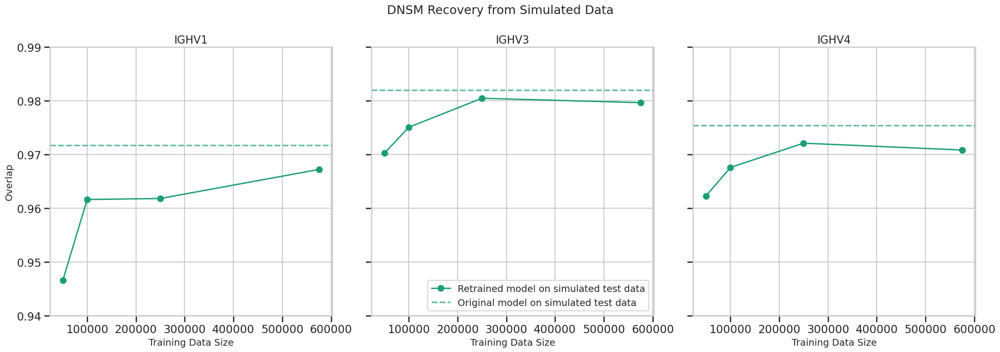

In [4]:

# Set style
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_context("talk")


# Map training sets to their sizes (for correct x-axis ordering)
train_set_order = dict(sorted(df_sizes.items(), key=lambda it: it[1]))

# Set style
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_context("talk")

# Create figure with 1 row and 3 columns (V gene families)
fig, axes = plt.subplots(1, 3, figsize=(21, 7), sharex=True, sharey=True)
fig.subplots_adjust(wspace=0.1)

# Define V families and test datasets
v_families = ['IGHV1', 'IGHV3', 'IGHV4']
test_datasets = ['rodriguezDnsmSim']
test_dataset_names = ['simulated test data']
colors = ['#1b9e77', '#d95f02']  # Blue for real test data, Orange for simulated test data
model_type = 'dnsm_1m'

# Loop through V families (columns)
for col_idx, v_family in enumerate(v_families):
    ax = axes[col_idx]
    
    # Get reference values from model trained on v1jaffe+v1tang
    reference_vals = {}
    for test_dataset in test_datasets:
        reference_df = retrain_comparison_df[
            (retrain_comparison_df['data_description'] == f"{test_dataset}_{v_family}") &
            (retrain_comparison_df['model_nickname'].str.startswith(f"{model_type}-")) &
            (retrain_comparison_df['train_data'] == 'v1jaffe+v1tang')
        ]
        if not reference_df.empty:
            reference_vals[test_dataset] = reference_df['overlap'].values[0]
    
    # Plot data for each test dataset
    for i, (test_dataset, test_dataset_name) in enumerate(zip(test_datasets, test_dataset_names)):
        # Filter for this test dataset and V family, excluding the reference training set
        df_subset = retrain_comparison_df[
            (retrain_comparison_df['data_description'] == f"{test_dataset}_{v_family}") & 
            (retrain_comparison_df['model_nickname'].str.startswith(f"{model_type}-")) &
            (retrain_comparison_df['train_data'] != 'v1jaffe+v1tang')
        ]
        
        # Sort by train_data_size
        df_subset = df_subset.sort_values('train_data_size')
        
        # Plot the overlap values
        ax.plot(df_subset['train_data_size'], df_subset['overlap'], 
                'o-', color=colors[i], linewidth=2, 
                label=f"Retrained model on {test_dataset_name}")
        
        # Add a horizontal line for the reference performance
        if test_dataset in reference_vals:
            ax.axhline(y=reference_vals[test_dataset], color=colors[i], 
                       linestyle='--', alpha=0.7,
                       label=f"Original model on {test_dataset_name}")
    
    # Set titles and labels
    ax.set_title(f"{v_family}", fontsize=16)
    if col_idx == 0:
        ax.set_ylabel('Overlap', fontsize=14)
    ax.set_xlabel('Training Data Size', fontsize=14)
    
    # Set y-axis limits for better visualization
    ax.set_ylim(0.94, 0.99)
    
    # Add legend only to the first subplot
    if col_idx == 1:
        ax.legend(loc='lower right', frameon=True, fontsize=14)

plt.tight_layout()

# Add an overall title
fig.suptitle('DNSM Recovery from Simulated Data', 
             fontsize=18, y=1.05)

plt.savefig('../output/dnsm_retrain_comparison_lineplot.svg', dpi=300, bbox_inches='tight')
plt.show()

In [5]:
def stratified_downsample(in_df, n_samples):
    df = in_df.copy().reset_index(drop=True)
    total_rows = len(df)
    if n_samples > total_rows:
        return df
    indices = np.linspace(0, total_rows-1, n_samples).astype(int)
    return df.iloc[indices].reset_index(drop=True)

In [ ]:
v1rodriguez_df = dxsm_data.pcp_df_of_multiname("v1rodriguez")
# sequence_panel = stratified_downsample(v1rodriguez_df, 1000)
sequence_panel = v1rodriguez_df.copy()
# sequence_panel = v1rodriguez_df.head(100)
sequence_panel = sequence_panel.drop(columns=[col for col in sequence_panel.columns if col.endswith("_light")])
sequence_panel = sequence_panel.drop(columns=["child_heavy", "child_name", "parent_name"])
sequence_panel["aa_parent"] = translate_sequences(sequence_panel["parent_heavy"])

Loading /home/wdumm/data/v3/rodriguez-airr-seq-race-prod-NoWinCheck_igh_pcp_2024-11-12_MASKED_NI_noN_no-naive.csv.gz
Filtering out problematic pairs of sample_id and clonal families [('sample-igg-SC-18', '440')]


In [7]:
original_crepe_prefix = localify(f"DNSM_TRAINED_MODELS_DIR/dnsm_1m-v1jaffe+v1tang-joint")
retrained_crepe_prefixes = [
    localify(f"DNSM_TRAINED_MODELS_DIR/dnsm_1m-jaffeTangDnsmSim50k-joint"),
    localify(f"DNSM_TRAINED_MODELS_DIR/dnsm_1m-jaffeTangDnsmSim100k-joint"),
    localify(f"DNSM_TRAINED_MODELS_DIR/dnsm_1m-jaffeTangDnsmSim250k-joint"),
    localify(f"DNSM_TRAINED_MODELS_DIR/dnsm_1m-jaffeTangDnsmSim-joint"),
]
original_crepe = heavy_chain_shim(load_crepe(original_crepe_prefix))
retrained_crepes = [heavy_chain_shim(load_crepe(pref)) for pref in retrained_crepe_prefixes]

In [8]:
original_crepe_evaluations = original_crepe(sequence_panel["aa_parent"])
retrained_crepe_evaluations = [crepe(sequence_panel["aa_parent"]) for crepe in retrained_crepes]

In [9]:
df_data = {"parent_aa": [], "aa_idx": [], "seq_idx": []}
transfer_columns = [col for col in sequence_panel.columns if col not in ["aa_parent", "parent_heavy"]]
df_data.update({col: [] for col in transfer_columns})
for seq_idx, row in sequence_panel.iterrows():
    for zero_idx, aa in enumerate(row["aa_parent"]):
        df_data["parent_aa"].append(aa)
        df_data["aa_idx"].append(zero_idx + 1)
        df_data["seq_idx"].append(seq_idx)
        for col in transfer_columns:
            df_data[col].append(row[col])

selection_factor_df = pd.DataFrame(df_data)
selection_factor_df["original_sf"] = [float(sf.detach().numpy()) for preds in original_crepe_evaluations for sf in preds]
for idx, vals in enumerate(retrained_crepe_evaluations):
    selection_factor_df[f"retrained_sf_{idx+1}"] = [float(sf.detach().numpy()) for preds in vals for sf in preds]


In [10]:
def plot_selection_factor_comparison(df, ax, x_name, y_name, limits, hexbin=True, plot_regression=False, **plot_kwargs):
    df = df.copy()
    if hexbin:
        hexbin_obj = ax.hexbin(
            df[x_name],
            df[y_name],
            zorder=-1,
            cmap="Purples",
            gridsize=(25, 15),
            **plot_kwargs,
        )
        ax.get_figure().colorbar(hexbin_obj, ax=ax, orientation='vertical', label='Count')
    else:
        sns.scatterplot(
            data=df,
            x=x_name,
            y=y_name,
            c="#43147E",
            linewidth=0.0,
            ax=ax,
            s=10,
            alpha=0.03,
            **plot_kwargs,
        )

    # calculate R2
    X = df[x_name].values.reshape(-1, 1)
    y = df[y_name].values

    # R² for y=x line.
    y_pred_identity = X.flatten()  # Predictions are just x values.
    ss_res = np.sum((y - y_pred_identity) ** 2)  # Residual sum of squares.
    ss_tot = np.sum((y - np.mean(y)) ** 2)  # Total sum of squares.
    r2_identity = 1 - (ss_res / ss_tot)
    ax.plot(limits, limits, color="#ecba17", label=f"$y=x$ ($R^2$: {r2_identity:.3f})")

    if plot_regression:
        reg = LinearRegression().fit(X, y)
        r2 = reg.score(X, y)
        Xplot = np.array([[X.min()], [X.max()]])
        ax.plot(Xplot, reg.predict(Xplot), color='#ff6b35', label=f"$R^2$: {r2:.3f}", linestyle="--")


    ax.legend(loc='upper left')
    ax.set_xlabel(x_name)
    ax.set_ylabel(y_name)
    ax.set_ylim(*limits)
    ax.set_xlim(*limits)
    plt.tight_layout()
    sns.despine()

all_y_cols = [
        ("retrained_sf_1", "retrained with 50k"), ("retrained_sf_2", "retrained with 100k"), ("retrained_sf_3", "retrained with 250k"), ("retrained_sf_4", "retrained with 570k")
    ]
first_last_y_cols = [
    all_y_cols[0],
    all_y_cols[-1]
]
def selection_factor_comparison_faceted_fig(y_cols, hexbin=True, log_scale=True, output_file=None, plot_regression=False, **plot_kwargs):
    v_families = ["IGHV1", "IGHV3", "IGHV4"]
    x_col = "original_sf"
    if log_scale:
        limits = (-6, 1.2)
        for y_col, _ in y_cols:
            selection_factor_df[y_col + "_log"] = np.log(selection_factor_df[y_col])
        log_xs = np.log(selection_factor_df[x_col])
        x_col = x_col + "_log"
        transform_string = " log "
        selection_factor_df[x_col] = log_xs
    else:
        transform_string = " "
        limits = (-0.1, 2.85)

    fig, axs = plt.subplots(len(y_cols), len(v_families), figsize=(7.8 * len(v_families), 6 * len(y_cols)), sharex=True, sharey=True)
    for col_idx, v_family in enumerate(v_families):
        for row_idx, (y_col, y_name) in enumerate(y_cols):
            ax = axs[row_idx][col_idx]
            if log_scale:
                y_col = y_col + "_log"
            
            plot_selection_factor_comparison(selection_factor_df[selection_factor_df["v_family_heavy"] == v_family], ax, x_col, y_col, limits, hexbin=hexbin, plot_regression=plot_regression, **plot_kwargs)
            if row_idx == len(y_cols) - 1:
                ax.set_xlabel("original" + transform_string + "selection factor")
            else:
                ax.set_xlabel("")
            if col_idx == 0:
                ax.set_ylabel(y_name + transform_string + "selection factor")
            else:
                ax.set_ylabel("")
            if row_idx == 0:
                ax.set_title(v_family)
    
    if output_file is not None:
        fig.savefig(output_file, dpi=300)
    return fig, axs

(<Figure size 2340x1200 with 12 Axes>,
 array([[<Axes: title={'center': 'IGHV1'}, ylabel='retrained with 50k log selection factor'>,
         <Axes: title={'center': 'IGHV3'}>,
         <Axes: title={'center': 'IGHV4'}>],
        [<Axes: xlabel='original log selection factor', ylabel='retrained with 570k log selection factor'>,
         <Axes: xlabel='original log selection factor'>,
         <Axes: xlabel='original log selection factor'>]], dtype=object))

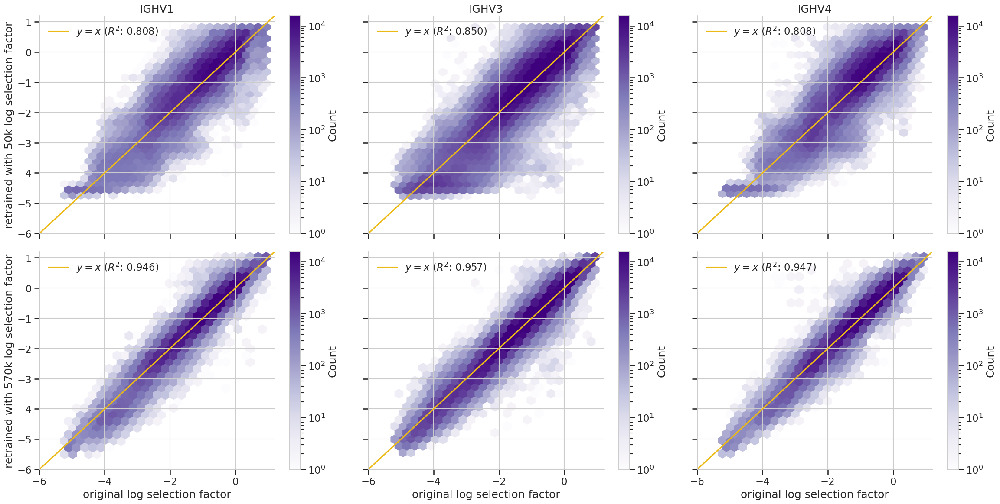

In [11]:
selection_factor_comparison_faceted_fig(first_last_y_cols, hexbin=True, log_scale=True, norm=mcolors.LogNorm(), output_file="../output/dnsm_retrain_selection_factor_comparison.svg")

(<Figure size 2340x2400 with 24 Axes>,
 array([[<Axes: title={'center': 'IGHV1'}, ylabel='retrained with 50k log selection factor'>,
         <Axes: title={'center': 'IGHV3'}>,
         <Axes: title={'center': 'IGHV4'}>],
        [<Axes: ylabel='retrained with 100k log selection factor'>,
         <Axes: >, <Axes: >],
        [<Axes: ylabel='retrained with 250k log selection factor'>,
         <Axes: >, <Axes: >],
        [<Axes: xlabel='original log selection factor', ylabel='retrained with 570k log selection factor'>,
         <Axes: xlabel='original log selection factor'>,
         <Axes: xlabel='original log selection factor'>]], dtype=object))

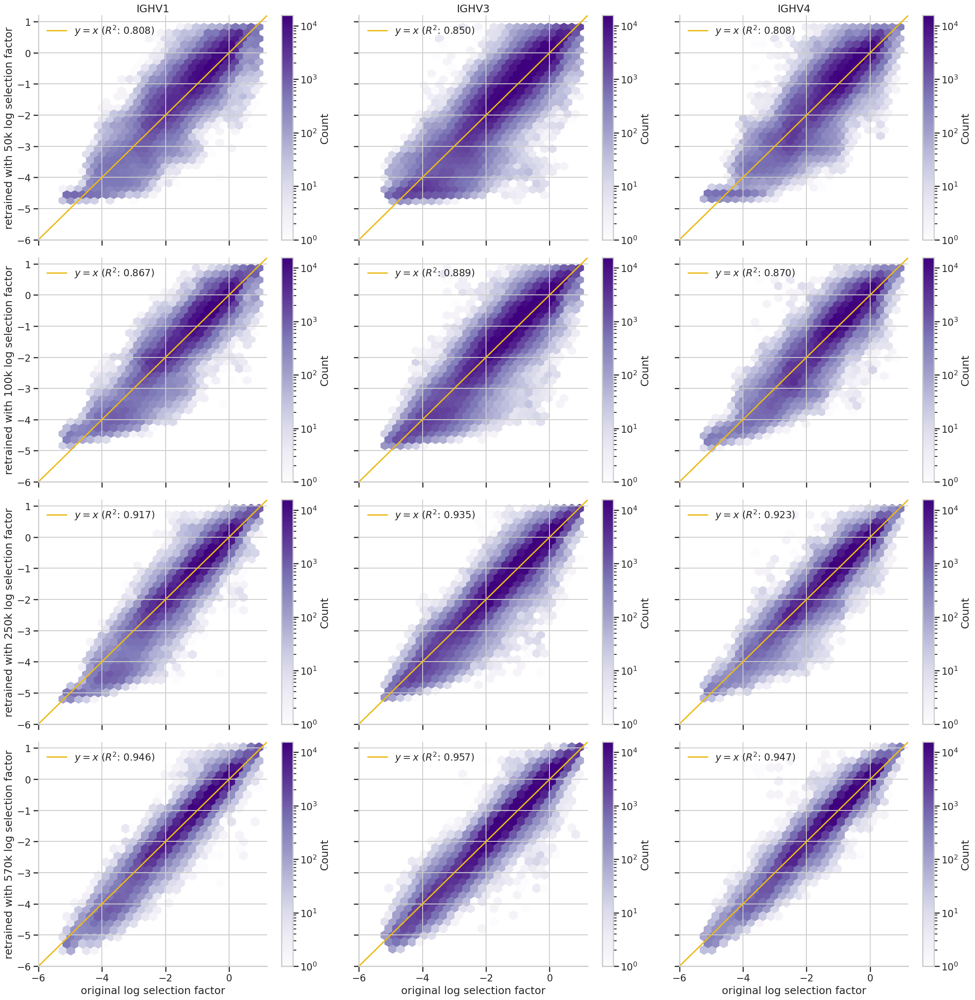

In [12]:

selection_factor_comparison_faceted_fig(all_y_cols, hexbin=True, log_scale=True, norm=mcolors.LogNorm(), output_file="../output/dnsm_retrain_selection_factor_comparison_supp1.svg")

(<Figure size 2340x2400 with 24 Axes>,
 array([[<Axes: title={'center': 'IGHV1'}, ylabel='retrained with 50k log selection factor'>,
         <Axes: title={'center': 'IGHV3'}>,
         <Axes: title={'center': 'IGHV4'}>],
        [<Axes: ylabel='retrained with 100k log selection factor'>,
         <Axes: >, <Axes: >],
        [<Axes: ylabel='retrained with 250k log selection factor'>,
         <Axes: >, <Axes: >],
        [<Axes: xlabel='original log selection factor', ylabel='retrained with 570k log selection factor'>,
         <Axes: xlabel='original log selection factor'>,
         <Axes: xlabel='original log selection factor'>]], dtype=object))

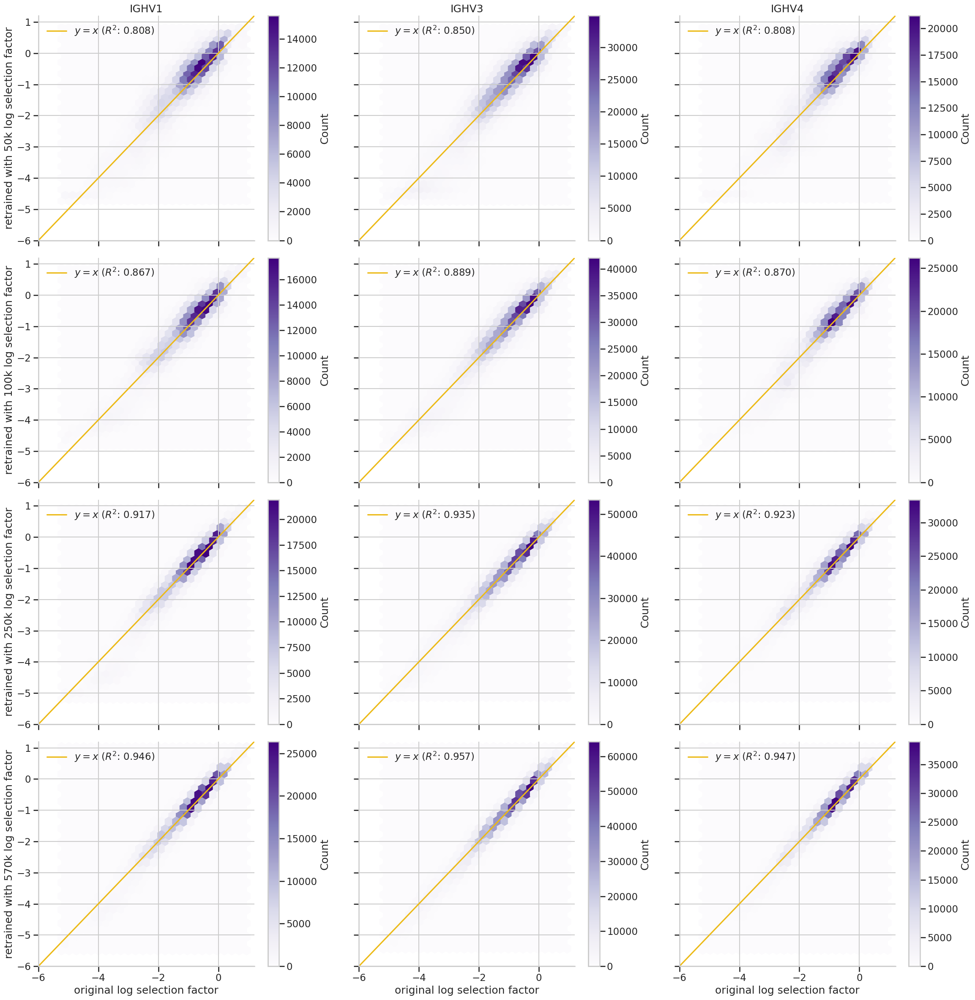

In [13]:
selection_factor_comparison_faceted_fig(all_y_cols, hexbin=True, log_scale=True, output_file="../output/dnsm_retrain_selection_factor_comparison_supp2.svg")

(<Figure size 2340x2400 with 24 Axes>,
 array([[<Axes: title={'center': 'IGHV1'}, ylabel='retrained with 50k selection factor'>,
         <Axes: title={'center': 'IGHV3'}>,
         <Axes: title={'center': 'IGHV4'}>],
        [<Axes: ylabel='retrained with 100k selection factor'>, <Axes: >,
         <Axes: >],
        [<Axes: ylabel='retrained with 250k selection factor'>, <Axes: >,
         <Axes: >],
        [<Axes: xlabel='original selection factor', ylabel='retrained with 570k selection factor'>,
         <Axes: xlabel='original selection factor'>,
         <Axes: xlabel='original selection factor'>]], dtype=object))

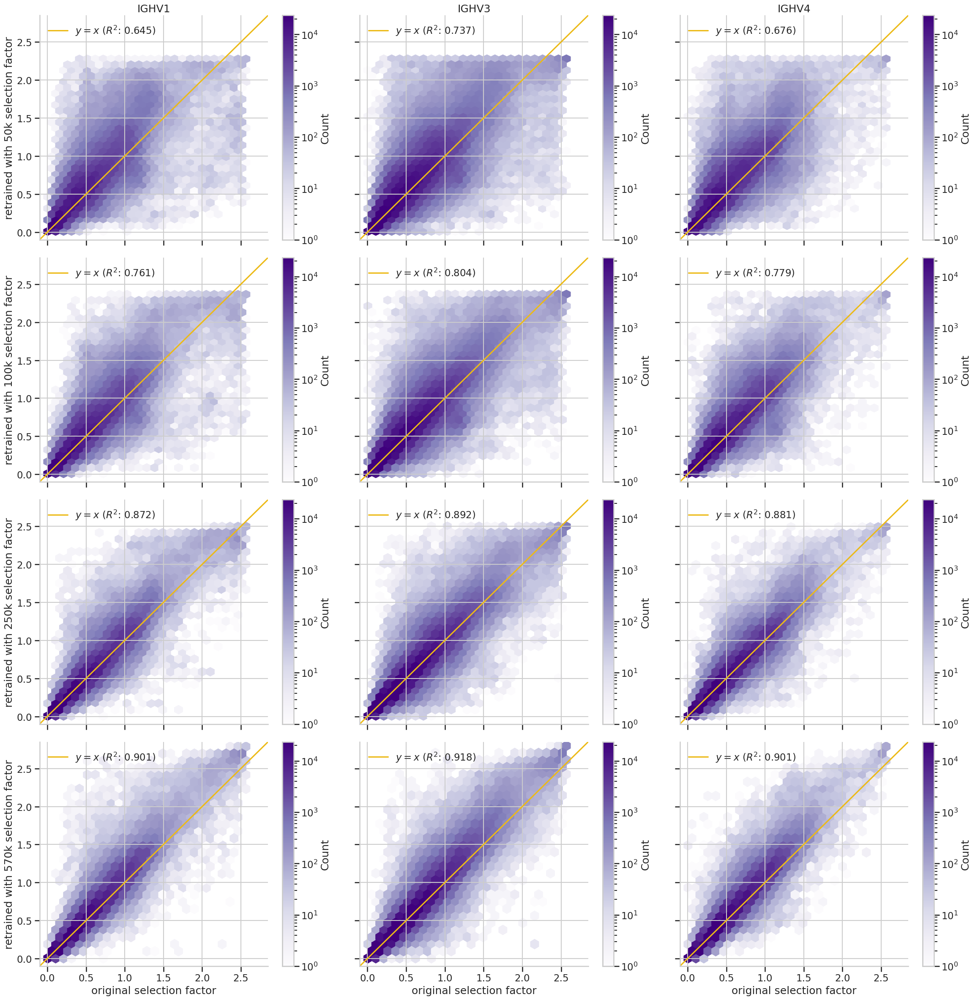

In [14]:
selection_factor_comparison_faceted_fig(all_y_cols, hexbin=True, log_scale=False, norm=mcolors.LogNorm(), output_file="../output/dnsm_retrain_selection_factor_comparison_supp3.svg")

(<Figure size 2340x2400 with 24 Axes>,
 array([[<Axes: title={'center': 'IGHV1'}, ylabel='retrained with 50k selection factor'>,
         <Axes: title={'center': 'IGHV3'}>,
         <Axes: title={'center': 'IGHV4'}>],
        [<Axes: ylabel='retrained with 100k selection factor'>, <Axes: >,
         <Axes: >],
        [<Axes: ylabel='retrained with 250k selection factor'>, <Axes: >,
         <Axes: >],
        [<Axes: xlabel='original selection factor', ylabel='retrained with 570k selection factor'>,
         <Axes: xlabel='original selection factor'>,
         <Axes: xlabel='original selection factor'>]], dtype=object))

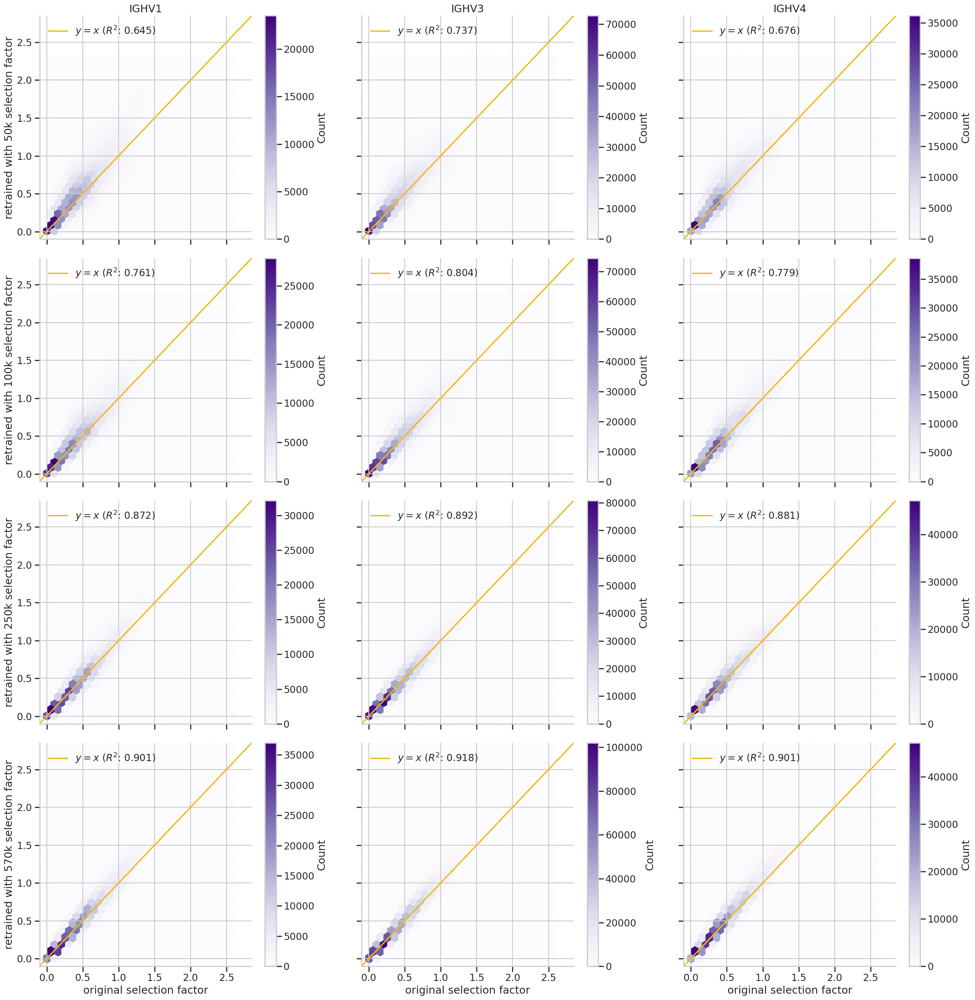

In [15]:
selection_factor_comparison_faceted_fig(all_y_cols, hexbin=True, log_scale=False, output_file="../output/dnsm_retrain_selection_factor_comparison_supp4.svg")

(<Figure size 2340x2400 with 12 Axes>,
 array([[<Axes: title={'center': 'IGHV1'}, ylabel='retrained with 50k log selection factor'>,
         <Axes: title={'center': 'IGHV3'}>,
         <Axes: title={'center': 'IGHV4'}>],
        [<Axes: ylabel='retrained with 100k log selection factor'>,
         <Axes: >, <Axes: >],
        [<Axes: ylabel='retrained with 250k log selection factor'>,
         <Axes: >, <Axes: >],
        [<Axes: xlabel='original log selection factor', ylabel='retrained with 570k log selection factor'>,
         <Axes: xlabel='original log selection factor'>,
         <Axes: xlabel='original log selection factor'>]], dtype=object))

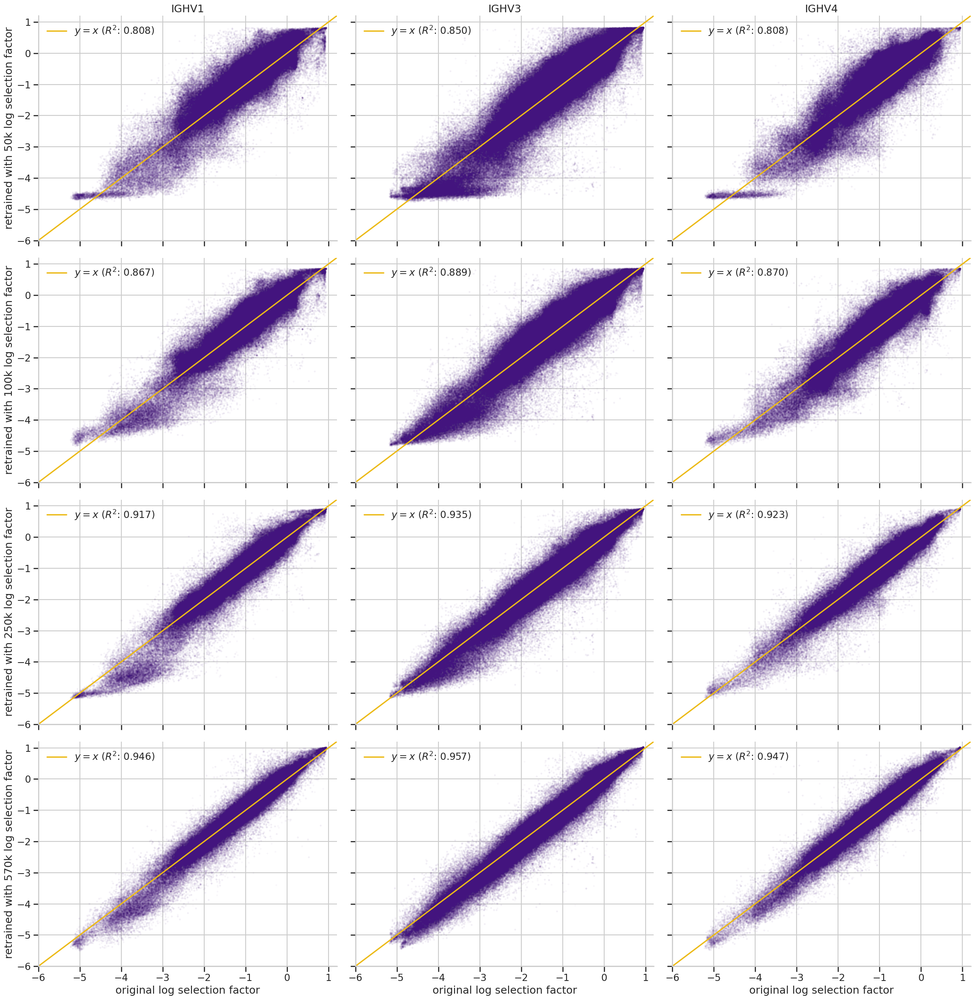

In [16]:
selection_factor_comparison_faceted_fig(all_y_cols, hexbin=False, log_scale=True)

(<Figure size 2340x2400 with 12 Axes>,
 array([[<Axes: title={'center': 'IGHV1'}, ylabel='retrained with 50k selection factor'>,
         <Axes: title={'center': 'IGHV3'}>,
         <Axes: title={'center': 'IGHV4'}>],
        [<Axes: ylabel='retrained with 100k selection factor'>, <Axes: >,
         <Axes: >],
        [<Axes: ylabel='retrained with 250k selection factor'>, <Axes: >,
         <Axes: >],
        [<Axes: xlabel='original selection factor', ylabel='retrained with 570k selection factor'>,
         <Axes: xlabel='original selection factor'>,
         <Axes: xlabel='original selection factor'>]], dtype=object))

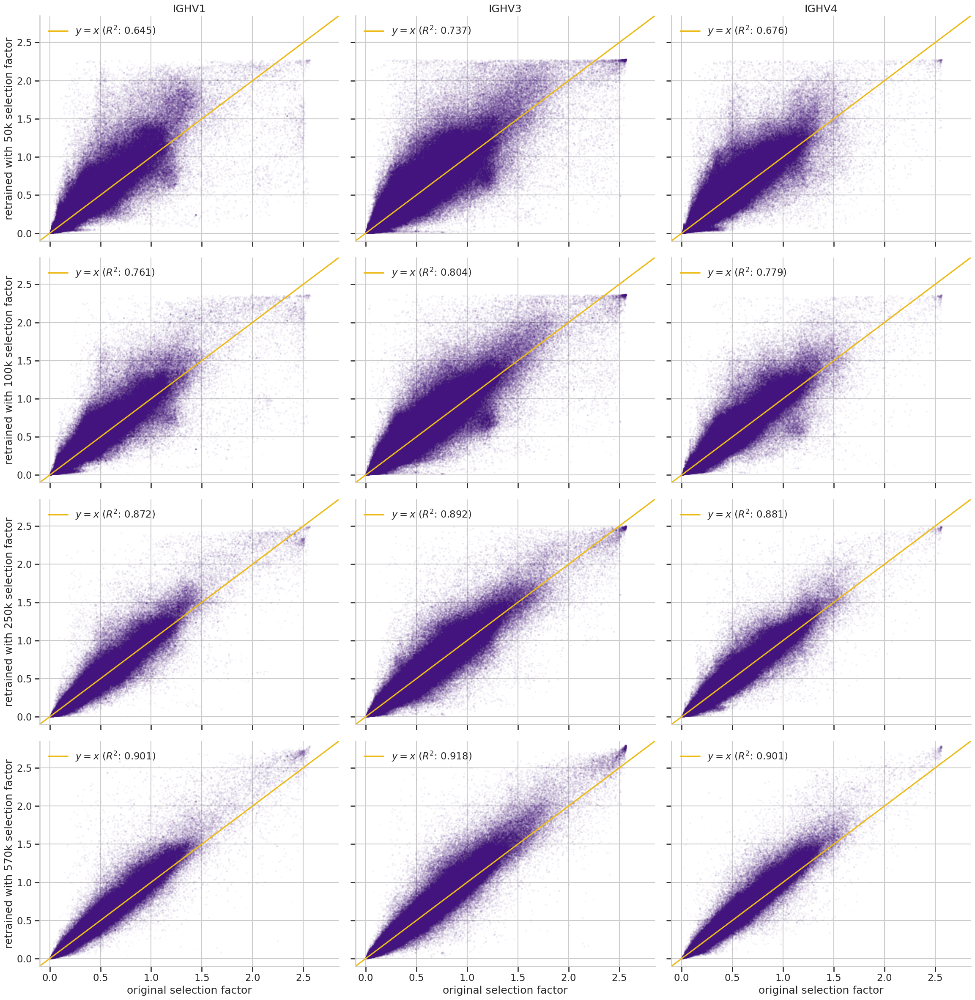

In [17]:

selection_factor_comparison_faceted_fig(all_y_cols, hexbin=False, log_scale=False)